## **Proyecto 01**

*Profesora*: M. Sc. Liliana Millán Núñez

*Materia*: Minería de datos

*Alumnos*: Pablo Barranco Soto, Ángel Farid Rojas Cruz

*CC.UU.*: 151528, 168072

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
np.random.seed(20201111)

In [ ]:
atw = pd.read_csv("Absenteeism_at_work.csv", sep=';')

- ### Cambia el nombre de las columnas para que estén en minúsculas, con guiones bajos en lugar de espacios y con guiones bajos en lugar de `/`.

In [ ]:
atw.rename(columns={col: col.lower() for col in atw.columns.values}, inplace=True)
atw.rename(columns={col: col.replace(' ','_').replace('/','_') for col in atw.columns.values}, inplace=True)
atw.dtypes

id                                   int64
reason_for_absence                   int64
month_of_absence                     int64
day_of_the_week                      int64
seasons                              int64
transportation_expense               int64
distance_from_residence_to_work      int64
service_time                         int64
age                                  int64
work_load_average_day_             float64
hit_target                           int64
disciplinary_failure                 int64
education                            int64
son                                  int64
social_drinker                       int64
social_smoker                        int64
pet                                  int64
weight                               int64
height                               int64
body_mass_index                      int64
absenteeism_time_in_hours            int64
dtype: object

## 1. Agregar una nueva columna `absenteeism_label` que tenga la etiqueta `0` si la variable `Absenteeism time in hours` es mayor a $4$ horas y el valor `1` en otro caso.

  - ### ¿Cuál es la distribución de la variable `absenteeism_label` en porcentaje?

In [ ]:
atw['absenteeism_label'] = atw['absenteeism_time_in_hours']
atw.absenteeism_label.mask(atw.absenteeism_label <= 4, 1, inplace=True) # 1 --> no se ausento mas de 4 hrs
atw.absenteeism_label.mask(atw.absenteeism_label > 4, 0, inplace=True) # 0 --> se ausento mas de 4 hrs

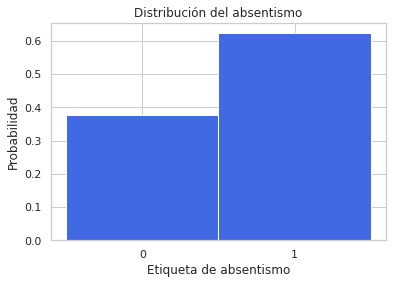

In [ ]:
sns.set(style="whitegrid")
bins = np.asarray([-0.5, 0.5, 1.5])
plt.xticks([0,1])
plt.hist(atw.absenteeism_label, bins= bins, density= True, color= 'royalblue')
plt.ylabel('Probabilidad')
plt.xlabel('Etiqueta de absentismo')
plt.title('Distribución del absentismo')
plt.show()

In [ ]:
print("El evento de no ausentarse durante más de 4 hrs [etiqueta 1] se distribuye como una variable aleatoria Bernoulli con parámetro p = {:.4f}.\n\
Es decir, hay un {:.2f}% de probabilidad de que el empleado se ausente más de 4 horas [etiqueta 0].".\
        format((atw[atw.absenteeism_label == 1].absenteeism_label.count()/atw.shape[0]),\
        (atw[atw.absenteeism_label == 0].absenteeism_label.count()/atw.shape[0])*100))

El evento de no ausentarse durante más de 4 hrs [etiqueta 1] se distribuye como una variable aleatoria Bernoulli con parámetro p = 0.6230.
Es decir, hay un 37.70% de probabilidad de que el empleado se ausente más de 4 horas [etiqueta 0].


- ### Elimina las columnas: `id`, `reason_for_absence` y `absenteeism_time_in_hours`

In [ ]:
atw.drop(labels = ['id', 'reason_for_absence', 'absenteeism_time_in_hours'], axis = 1, inplace = True)

## 2. Genera la tabla de data profiling de las variables numéricas y categóricas.

In [ ]:
! pip install pandas-profiling==2.7.1

In [ ]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(pd.DataFrame(atw), title='Pandas Profiling Report', html= {'style':{'full_width':True}})
profile

- ### Describe las 3 cosas más importantes de cada tabla (3 variables diferentes)

Notamos relevantes las siguientes características:


1.   Numéricas
> * $\texttt{age}$: tiene $\text{media} = 36$ años
> * $\texttt{work_load_average_day_}$: presenta $\text{mínimo} = 205.917$  y $\text{máximo} = 378.884$ por lo cual el promedio de trabajo por día ronda en el rango $[205.917,378.884]$ de carga de trabajo / día.
> * $\texttt{distance_from_residence_to_work}$: observamos $\text{varianza} = 220.13$ km con lo cual podemos ver que hay grandes diferencias respecto a las distancias que recorren los empleados para llegar a su trabajo.

2.   Booleanas
> * $\texttt{disciplinary_failure}$: De las $740$ observaciones con las que contamos, solo se han presentado $40$ faltas disciplinarias.
> * $\texttt{social_drinker}$: El $56.8\%$ de los empleados son bebedores sociales, mientras que el otro $43.2\%$ no lo es.
> * $\texttt{absenteeism_label}$: La moda es  $\textit{absenteeism_label} = 1$, con $461$ empleados que tuvieron faltas menor a $4$ hrs.

3.   Categóricas 
> * $\texttt{education}$: tiene $\text{moda} = 1$
> * $\texttt{seasons}$: Datos homogéneos. Es decir $\text{frec}(\textit{season}=i) \approx 25\%$ para las cuatro clases $i = 1 \ldots 4$.
> * $\texttt{education}$: Podemos observar una gran discrepancia entre la proporcion de observaciones de clase $\text{education} = 1$ con las de clase $\text{education} = 4$





## 3. Genera 5 gráficas *clave*

 ### Incluye interpretación


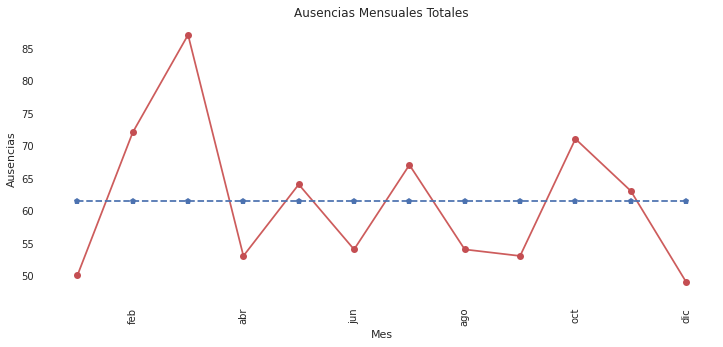

In [ ]:
month_abs = atw.where(atw['month_of_absence'] != 0).groupby(['month_of_absence'])['month_of_absence'].count()
labels= ['ene','feb','abr','jun','ago','oct','dic']

# Grafica 1
plt.figure(figsize=(12, 5)) 
plt_0 = sns.lineplot(x=[1,2,3,4,5,6,7,8,9,10,11,12], y = month_abs,markers=True,color="indianred")
plt.plot(np.arange(1,13),month_abs,'o',linewidth=3,color= 'r')
plt.plot(np.arange(1,13),np.repeat(np.mean(month_abs),12),'--p')
plt_0.set_xticklabels(labels, rotation='vertical', fontsize=10)
plt.xlabel('Mes')
plt.ylabel('Ausencias')
plt.title('Ausencias Mensuales Totales')
plt.show()

En esta gráfica podemos interpretarla como una serie de tiempo. En donde se presentan las ausencias totales laborales que hubo ya sean mayores a $4$ hrs o no. Aquí podemos ver lo siguiente:

* Los meses con mayor número de ausencias son marzo y octubre.
* Los meses con menor número de ausencias son enero y diciembre.
* Podemos ver cómo existe una tendencia de $63$ faltas al mes. Sobre todo entre abril y septiembre.




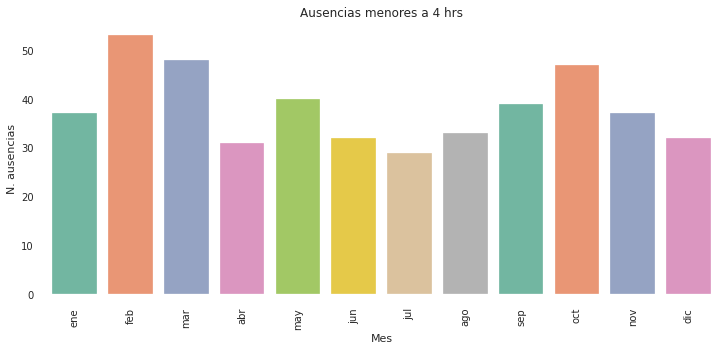

In [ ]:
# Grafica 2
menores = atw[atw['absenteeism_label'] == 1]
mayores = atw[atw['absenteeism_label'] == 0]
labels= ['ene','feb','mar','abr','may','jun','jul','ago','sep','oct','nov','dic']

plt.figure(figsize=(12, 5)) 
#plt_1 = sns.countplot(data=atw.loc[atw['month_of_absence']!=0], hue="absenteeism_label",x="month_of_absence")
plt_1 = sns.countplot(data=menores.loc[atw['month_of_absence']!=0].sort_values('month_of_absence', ascending = False), x="month_of_absence", palette= "Set2")
plt_1.set_xticklabels(labels, rotation='vertical', fontsize=10)
plt_1.set_title('Ausencias menores a 4 hrs')
plt_1.set_ylabel('N. ausencias')
plt_1.set_xlabel('Mes')
plt.show()



Esta gráfica nos puede dar más información sobre el problema a estudiar. Aquí podemos ver una vez filtrados los datos, cuáles fueron los meses con mayor y menor número de ausencias menores a $4$ hrs.

* Vemos que febrero, octubre y marzo son los meses con mayor número de ausencias menores a $4$ hrs.
* Los meses con menor número de ausencias menores a $4$ hrs son agosto, junio, julio y diciembre.



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


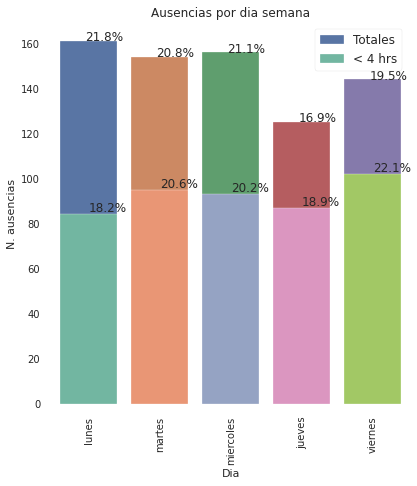

In [ ]:
# Grafica 3
labels= ['lunes', 'martes','miercoles','jueves','viernes']
labels_2 = ["Totales", "< 4 hrs"]
p4_1 = atw.groupby(['day_of_the_week'])['day_of_the_week'].agg(['count'])
p4_2 = menores.groupby(['day_of_the_week'])['day_of_the_week'].agg(['count'])

def without_hue(plot, feature, bol = 1):
    if (bol == 1):
      total = 740
    else:
      total = 461
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)


plt.figure(figsize=(14, 7)) 
plt.subplot(1,2,1)
ax = sns.countplot(x="day_of_the_week", data=atw)
ax.set_xticklabels(labels, rotation='vertical', fontsize=10)
without_hue(ax, p4_1, 1)
plt.subplot(1,2,1)
ax = sns.countplot(x="day_of_the_week", palette="Set2",data=menores)
ax.set_xticklabels(labels, rotation='vertical', fontsize=10)
ax.set_title('Ausencias por dia semana')
ax.set_ylabel('N. ausencias')
ax.set_xlabel('Dia')
ax.text(0,85 , "18.2%",fontsize = 12)
ax.text(1,96 , "20.6%",fontsize = 12)
ax.text(2,94 , "20.2%",fontsize = 12)
ax.text(3,88 , "18.9%",fontsize = 12)
ax.text(4,103 , "22.1%",fontsize = 12)
ax.legend(labels_2,fontsize = 12)
plt.show()

En esta visualización podemos ver cuáles fueron los días con mayor y menor número de ausencias totales y menores $4$ hrs.

* Los días con mayor numero de ausencias totales son lunes y miércoles. Lo cual contrasta pues el lunes es de los que menos ausencias tiene que son menores a $4$ hrs.
* Notamos que los días con mayor número de ausencias menor a $4$ hrs son los viernes y martes. 
* Por otro lado los lunes y jueves son los días que presentan menor ausencias menores a $4$ hrs.





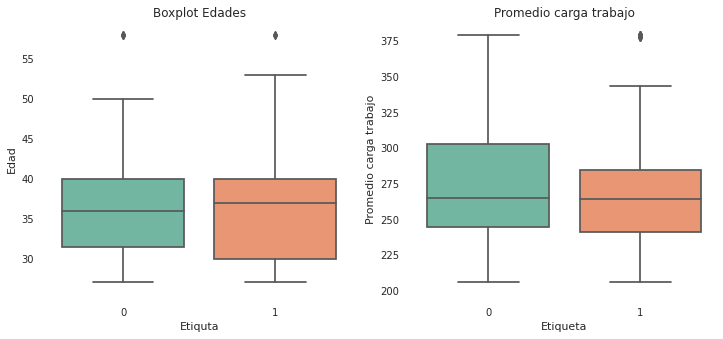

In [ ]:
# Grafica 4
plt.figure(figsize=(12, 5)) 
plt.subplot(1, 2, 1)
plt_3 = sns.boxplot(x = "absenteeism_label", y="age",palette = "Set2",data=atw)
plt_3.set_title('Boxplot Edades')
plt_3.set_ylabel('Edad')
plt_3.set_xlabel('Etiquta')
plt.subplot(1, 2, 2)
plt_4 = sns.boxplot(x = "absenteeism_label", y="work_load_average_day_",palette = "Set2",data=atw)
plt_4.set_title('Promedio carga trabajo')
plt_4.set_ylabel('Promedio carga trabajo')
plt_4.set_xlabel('Etiqueta')
plt.show()

Mediante estos *boxplots* podemos saber lo siguiente:
* La edad promedio de aquellos que faltan menos de $4$ hrs es mas alta de aquellos que faltan más de $4$ hrs. Y la edad varía más para aquellas personas que faltan menos de $4$ hrs.
* El promedio de carga de trabajo es el mismo para aquellos que se ausentan más de $4$ hrs que para aquellos que se ausentaan menos de $4$ hrs. Pero la varianza es mayor para aquellos que se ausentan más de $4$ hrs. 


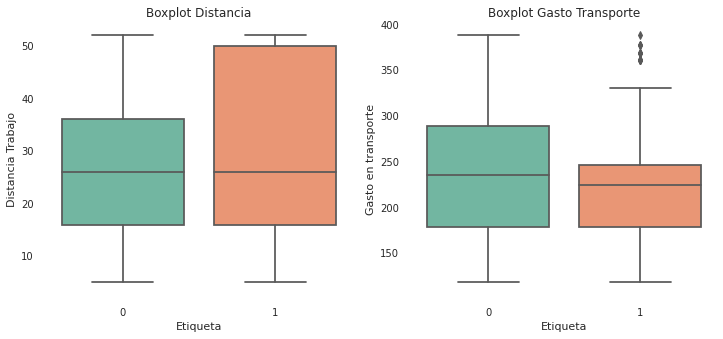

In [ ]:
#Grafica 5 

plt.figure(figsize=(12, 5)) 
plt.subplot(1, 2, 1)
plt_5 = sns.boxplot(x = "absenteeism_label", y="distance_from_residence_to_work",palette = "Set2",data=atw)
plt_5.set_title('Boxplot Distancia')
plt_5.set_ylabel('Distancia Trabajo')
plt_5.set_xlabel('Etiqueta')
plt.subplot(1, 2, 2)
plt_6 = sns.boxplot(x = "absenteeism_label", y="transportation_expense",palette = "Set2",data=atw)
plt_6.set_title('Boxplot Gasto Transporte')
plt_6.set_ylabel('Gasto en transporte')
plt_6.set_xlabel('Etiqueta')
plt.show()

Despues de analizar estas gráficas, podemos observar lo siguiente:

* La media distancia de los hogares al trabajo es la misma para observaciones que se ausentan más de $4$ hrs y para quellos que se ausentan menos de $4$ hrs. La varianza es  significativamente mayor para aquellos que se ausentan menos de $4$ hrs. 
* En promedio gastan más en transporte aquellos que faltan menos de $4$ hrs que aquellos que se ausentan más de $4$ hrs. Pero la varianza de gasto en transporte es mayor para aquellos que se ausentan menos de $4$ hrs. 

### Ocupando la semilla `20201111` y 75% de tus datos para entrenamiento:

In [ ]:
from sklearn.model_selection import train_test_split
np.random.seed(20201111)

y= atw.absenteeism_label
X= atw.drop(labels = ['absenteeism_label'], axis = 1)
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size = 0.25)
print("\nX_train, y_train: ", (X_train.shape, y_train.shape))
print("\nX_test, y_test: ", (X_test.shape, y_test.shape))


X_train, y_train:  ((555, 18), (555,))

X_test, y_test:  ((185, 18), (185,))


## 4. Entrena un RandomForest a través de un `GridSearchCV` que cumpla con lo siguiente:

- ### Genera al menos 10 modelos diferentes (al menos 2 hiperparámetros)
- ### Ocupa `CV` (_k-fold_) de 3
- ### Ocupa la eficiencia como métrica para seleccionar el mejor modelo

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import time
np.random.seed(20201111)

#grid = {'n_estimators': [700, 800, 900], 'min_samples_leaf': [9, 11, 13], 'criterion':['gini', 'entropy'], 
        #'max_features': ['sqrt'], 'max_depth' : [25, 28]}
        
#grid = {'n_estimators': [10,50,100,150], 'min_samples_leaf': [3,9,15], 'criterion':['gini', 'entropy'], 
        #'max_features': ['sqrt','log2']}

#grid = {'n_estimators': [500,750,1000,1250], 'min_samples_leaf': [3,8,12], 'criterion':['gini', 'entropy'], 
        #'max_features': ['auto','sqrt',], 'max_depth': [25,None]}

grid = {'n_estimators': [15,50,100,150], 'min_samples_leaf': [3,8,12], 'criterion':['gini', 'entropy'], 
        'max_features': ['auto','sqrt',], 'max_depth': [25,12,None]}

rf = RandomForestClassifier(oob_score=True, n_jobs=-1)
gs_rf = GridSearchCV(rf, grid, cv=3, scoring='precision', return_train_score=True, n_jobs=-1)

start = time.time()
gs_rf.fit(X_train, y_train)
print("tiempo de ejecución en segundos: {}".format(time.time() - start))

tiempo de ejecución en segundos: 105.7195885181427


## 5. ¿Cuáles son los hiperparámetros del mejor modelo?

In [ ]:
print("Datos completos: {}, \n\n Hiperparámetros: {} \n\n Número de features: {}".\
      format(gs_rf.best_estimator_, gs_rf.best_params_, gs_rf.best_estimator_.n_features_))

Datos completos: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=-1,
                       oob_score=True, random_state=None, verbose=0,
                       warm_start=False), 

 Hiperparámetros: {'criterion': 'entropy', 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 3, 'n_estimators': 50} 

 Número de features: 18


## 6. ¿Cuál es el valor del OOB? Interpreta

In [ ]:
print("El error fuera de la bolsa se aproxima a {:.4f}.\nEsto quiere decir que, en promedio, los árboles que componen nuestro Random Forest\nse equivocan un {:.2f}% de las veces, con las observaciones que quedan fuera del árbol.".format(gs_rf.best_estimator_.oob_score_, 100*gs_rf.best_estimator_.oob_score_))

El error fuera de la bolsa se aproxima a 0.7171.
Esto quiere decir que, en promedio, los árboles que componen nuestro Random Forest
se equivocan un 71.71% de las veces, con las observaciones que quedan fuera del árbol.


Por otro lado, es posible que estemos subentrenando. [Referencia](https://scikit-learn.org/stable/auto_examples/ensemble/plot_ensemble_oob.html)



## 7. ¿Cuáles son los 5 *features* que aportan más información, cuánto aporta cada uno?

In [ ]:
def get_feature_importance(feature_importances, data):
    fi = pd.Series(feature_importances).sort_values(ascending=False)
    names = pd.Series(data.columns.values)
    df_1 = pd.DataFrame({'feature_importance': fi, 'column': fi.index})
    df_2 = pd.DataFrame({'feature': names, 'column': names.index})
    df = df_2.merge(df_1).sort_values(by="feature_importance", ascending=False)
    df.drop(labels = ['column'], axis = 1, inplace= True)
    return df

fi_order= get_feature_importance(gs_rf.best_estimator_.feature_importances_, X)
fi_order.head()

,feature,feature_importance
7,work_load_average_day_,0.151211
0,month_of_absence,0.102499
8,hit_target,0.094316
1,day_of_the_week,0.092183
3,transportation_expense,0.081798


## 8. ¿Cuáles son los 5 *features* que aportan menos información, cuánto aporta cada uno?

In [ ]:
fi_order.tail()

,feature,feature_importance
9,disciplinary_failure,0.036070
14,pet,0.016868
12,social_drinker,0.008718
10,education,0.008351
13,social_smoker,0.002502



### Elimina las columnas que aportan menos del $5\%$ de información (sin volver a hacer otro corte de *train test*) y vuelve a correr tu `GridSearchCV`

In [ ]:
np.random.seed(20201111)
var_exc = fi_order["feature"][fi_order.feature_importance >= .05].values
X_train = X_train.filter(var_exc, axis = 1)
X_test = X_test.filter(var_exc, axis = 1)

#grid2 = {'n_estimators': [700, 800, 900], 'min_samples_leaf': [9, 11, 13], 'criterion':['gini', 'entropy'], 
        #'max_features': ['sqrt'], 'max_depth' : [25, 28]}

#grid2 = {'n_estimators': [700, 800, 900], 'min_samples_leaf': [3,9,15], 'criterion':['gini', 'entropy'], 
        #'max_features': ['sqrt','log2']}

#grid2 = {'n_estimators': [500,750,1000,1250], 'min_samples_leaf': [3,8,12], 'criterion':['gini', 'entropy'], 
        #'max_features': ['auto','sqrt',], 'max_depth': [25,None]}

grid2 = {'n_estimators': [15,50,100,150], 'min_samples_leaf': [3,8,12], 'criterion':['gini', 'entropy'], 
        'max_features': ['auto','sqrt',], 'max_depth': [25,12,None]}



rf2 = RandomForestClassifier(oob_score=True, n_jobs=-1)
gs_rf2 = GridSearchCV(rf2, grid2, cv=3, scoring='precision', return_train_score=True, n_jobs=-1)
start = time.time()
gs_rf2.fit(X_train, y_train)
print("tiempo de ejecución en segundos: {}".format(time.time() - start))

tiempo de ejecución en segundos: 105.75365042686462


## 9. ¿Cuáles son los hiperparámetros del mejor modelo?

In [ ]:
print("Datos completos: {}, \n\n Hiperparámetros: {} \n\n Número de features: {}".\
      format(gs_rf2.best_estimator_, gs_rf2.best_params_, gs_rf2.best_estimator_.n_features_))

Datos completos: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=25, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=-1,
                       oob_score=True, random_state=None, verbose=0,
                       warm_start=False), 

 Hiperparámetros: {'criterion': 'entropy', 'max_depth': 25, 'max_features': 'auto', 'min_samples_leaf': 3, 'n_estimators': 15} 

 Número de features: 8


## 10. ¿Cuál el es el valor de OOB? Interpreta

In [ ]:
print("El error fuera de la bolsa se redujo a {:.4f},\nesto es positivo ya que el 37% de las observaciones sobrantes que quedan fuera del árbol;\nes decir, en promedio, se equivoca el {:.2f}% de las veces.".format(gs_rf2.best_estimator_.oob_score_, 100*gs_rf2.best_estimator_.oob_score_))

El error fuera de la bolsa se redujo a 0.6523,
esto es positivo ya que el 37% de las observaciones sobrantes que quedan fuera del árbol;
es decir, en promedio, se equivoca el 65.23% de las veces.


[Referencia](https://github.com/silil/md_ago_dic_2020/blob/master/supervisado/clasificacion/random_forests.md)

In [ ]:
from sklearn.metrics import precision_score
np.random.seed(20201111)

#Para ver si estamos haciendo overfiting
model = gs_rf2.best_estimator_
model.fit(X_train,y_train)
entrenamiento = model.score(X_train,y_train)
y_hat = model.predict(X_test)
prueba = precision_score(y_test,y_hat)

print("\n\nPara aclarar lo ya mencionado, comparamos el score de precisión de entrenamiento contra el de prueba.\n\
  Entrenamiento: {:.6f}\n\
  Prueba: {:.6f}\n\
De lo cual podemos afirmar que el modelo no esta subentrenando, pues la diferencia en precisión entre prueba y entrenamiento es significativa.".format(prueba,entrenamiento))



Para aclarar lo ya mencionado, comparamos el score de precisión de entrenamiento contra el de prueba.
  Entrenamiento: 0.727273
  Prueba: 0.852252
De lo cual podemos afirmar que el modelo no esta subentrenando, pues la diferencia en precisión entre prueba y entrenamiento es significativa.


## 11. Genera la curva ROC, ¿cuánto tiene de AUC? Interpreta

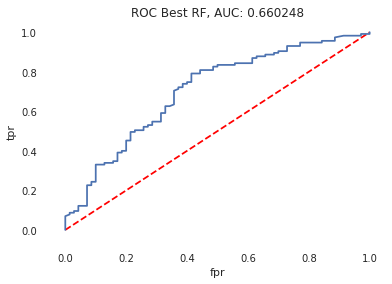

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(20201111)

predicted_labels = gs_rf2.predict(X_test)
predicted_scores = gs_rf2.predict_proba(X_test)

fpr, tpr, thresholds_roc = roc_curve(y_test, predicted_scores[:,1], pos_label=1)

plt.clf()
plt.plot([0,1],[0,1], 'k--', c="red")
plt.plot(fpr, tpr)
plt.title("ROC Best RF, AUC: {:.6f}".format(roc_auc_score(y_test, predicted_labels)))
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.show()

In [ ]:
print("El área bajo la curva se aproxima a {:.4f}. \n\
Lo cual no es suficiente bueno pero tampoco es terrible pues entre más grande mejor.".format(roc_auc_score(y_test, predicted_labels)))

El área bajo la curva se aproxima a 0.6602. 
Lo cual no es suficiente bueno pero tampoco es terrible pues entre más grande mejor.


## 12. Genera la tabla de métricas de desempeño que incluya: el *score* del modelo, `tpr`, `fpr`, `tnr`, `fnr`, `precision`, `recall` y `f1_score`

In [ ]:
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, predicted_scores[:,1])
thresholds = np.append(thresholds, 2.)
metrics_report = pd.DataFrame({'threshold': thresholds, 'precision': pd.Series(precision), 'recall': pd.Series(recall)})
metrics_report['f1_score'] = 2 * (metrics_report.precision * metrics_report.recall)/(metrics_report.precision + metrics_report.recall)
df_aux = pd.DataFrame({'tpr': tpr, 'fpr': fpr, 'threshold': thresholds_roc})
df_aux['tnr'] = 1 - df_aux['fpr']
df_aux['fnr'] = 1 - df_aux['tpr']
metrics_report = metrics_report.merge(df_aux)
metrics_report.sort_values(by='threshold', ascending=False, inplace=True)
metrics_report.round(4)

,threshold,precision,recall,f1_score,tpr,fpr,tnr,fnr
81,0.9949,1.0000,0.0174,0.0342,0.0174,0.0000,1.0000,0.9826
80,0.9593,1.0000,0.0696,0.1301,0.0696,0.0000,1.0000,0.9304
79,0.9587,0.9000,0.0783,0.1440,0.0783,0.0143,0.9857,0.9217
78,0.9567,0.9091,0.0870,0.1587,0.0870,0.0143,0.9857,0.9130
77,0.9499,0.8333,0.0870,0.1575,0.0870,0.0286,0.9714,0.9130
...,...,...,...,...,...,...,...,...
4,0.2119,0.6384,0.9826,0.7740,0.9826,0.9143,0.0857,0.0174
3,0.1956,0.6243,0.9826,0.7635,0.9826,0.9714,0.0286,0.0174
2,0.1650,0.6264,0.9913,0.7677,0.9913,0.9714,0.0286,0.0087
1,0.1297,0.6196,0.9913,0.7625,0.9913,1.0000,0.0000,0.0087


Solo podemos tener un máximo de $5.0000\%$ de errores del estilo: el modelo predice que el empleado se ausentará menos de $5$ horas pero el empleado se ausentó por más de $4$ horas.

## 13. ¿Cuál es el punto de corte del modelo?

In [ ]:
th_opt = metrics_report[(metrics_report.fpr <= 0.05) & (metrics_report.tpr == metrics_report[metrics_report.fpr <= 0.05].tpr.max())]
th_opt.round(4)

,threshold,precision,recall,f1_score,tpr,fpr,tnr,fnr
74,0.9256,0.8235,0.1217,0.2121,0.1217,0.0429,0.9571,0.8783


In [ ]:
print("El punto de corte para esta especificación de negocio equivale a {:.4f}.".format(float(th_opt.threshold)))

El punto de corte para esta especificación de negocio equivale a 0.9256.


## 14. En este punto de corte, ¿cuánto tiene de eficiencia y cobertura? Interpreta

In [ ]:
print("La métrica de eficiencia corresponde a {:.4f}%, mientras que la cobertura es de {:.4f}%.".format(float(th_opt.precision)*100, float(th_opt.recall)*100))

La métrica de eficiencia corresponde a 82.3529%, mientras que la cobertura es de 12.1739%.


## 15. En este punto de corte, ¿cuánto tiene de `tpr`, `fpr`, `tnr` y `fnr`?

In [ ]:
print("Las proporciones son las siguientes: \n\
TPR: {:.2f}%\n\
FPR: {:.2f}%\n\
TNR: {:.2f}%\n\
FNR: {:.2f}%".format(float(th_opt.tpr)*100, float(th_opt.fpr)*100, float(th_opt.tnr)*100, float(th_opt.fnr)*100))

Las proporciones son las siguientes: 
TPR: 12.17%
FPR: 4.29%
TNR: 95.71%
FNR: 87.83%


## 16. En este punto de corte, ¿cuántas etiquetas 1 tendremos en el conjunto de pruebas?

In [ ]:
th_opt_thresh = th_opt.threshold.values[0].round(15)
labels_threshold = [0 if score < th_opt_thresh else 1 for score in predicted_scores[:,1]]

df = pd.DataFrame({'predicted': labels_threshold, 'true_label': y_test})
df['tp'] = df[['predicted','true_label']].apply(lambda x: 1 if x.true_label == 1\
                                                and x.predicted == x.true_label else 0, axis=1)
df['fn'] = df[['predicted','true_label']].apply(lambda x: 1 if x.true_label == 1\
                                                and x.predicted != x.true_label else 0, axis=1)
df['tn'] = df[['predicted','true_label']].apply(lambda x: 1 if x.true_label == 0\
                                                and x.predicted == x.true_label else 0, axis=1)
df['fp'] = df[['predicted','true_label']].apply(lambda x: 1 if x.true_label == 0\
                                                and x.predicted != x.true_label else 0, axis=1)
cnf_det = np.array([['True Pos.', df.tp.sum()], ['False Pos.', df.fp.sum()],\
                    ['True Neg.', df.tn.sum()], ['False Neg.', df.fn.sum()]])
cnf_det

array([['True Pos.', '13'],
       ['False Pos.', '3'],
       ['True Neg.', '67'],
       ['False Neg.', '102']], dtype='<U10')

In [ ]:
print("En nuestro conjunto de pruebas, hay un total de {} predicciones con etiqueta [1],\n mientras que hay {} observaciones con etiqueta real [1].".\
      format(df.tp.sum()+df.fp.sum(), df.tp.sum()+df.fn.sum()))

En nuestro conjunto de pruebas, hay un total de 16 predicciones con etiqueta [1],
 mientras que hay 115 observaciones con etiqueta real [1].


## 17. En este punto de corte, ¿cuál es la matriz de confusión? Interpreta

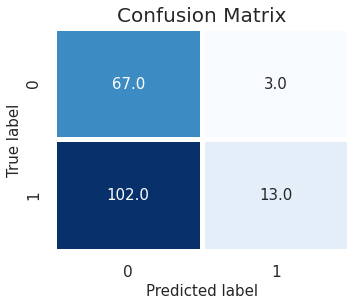

In [ ]:
from sklearn.metrics import confusion_matrix
np.random.seed(20201111)

cnf_mtx = confusion_matrix(y_test, labels_threshold)
cnf_df = pd.DataFrame(data = cnf_mtx, index = ["Real [0]", "Real [1]"], columns = ["Pred [0]", "Pred [1]"])

sns.set(font_scale=1.4)

#Ploteamos la Matriz de Confusion
figure = plt.figure(figsize=(5, 4))
sns.heatmap(cnf_mtx, annot=True,annot_kws={"size": 15},fmt=".1f",cmap=plt.cm.Blues, cbar= False, linewidths=4)
plt.tight_layout()
plt.ylabel('True label',fontsize=15)
plt.title('Confusion Matrix',fontsize=20)
plt.xlabel('Predicted label',fontsize=15)
plt.show()

In [ ]:
print("El algoritmo clasificó {} observaciones negativas y {} positivas de manera correcta.\n\
Nuestro random forest clasificó de manera incorrecta {} falsos negativos y {} falsos positivos.".format(cnf_mtx.item(0,0),cnf_mtx.item(1,1),cnf_mtx.item(1,0),cnf_mtx.item(0,1)))

El algoritmo clasificó 67 observaciones negativas y 13 positivas de manera correcta.
Nuestro random forest clasificó de manera incorrecta 102 falsos negativos y 3 falsos positivos.
